In [1]:
import torch

In [2]:
torch.cuda.max_memory_allocated()

0

In [3]:
import numpy as np
import matplotlib.pyplot as plt

In [4]:
from torch.utils.data.sampler import SubsetRandomSampler

In [5]:
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms

In [6]:
from torchvision.datasets import ImageFolder

In [7]:
from torch.utils.data import DataLoader

In [8]:
data_dir = r'C:\Users\user\OneDrive\Masaüstü\Data science\Week11\archive (1)'

In [9]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Resize((170,170)), transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))])

In [10]:
train_data = ImageFolder(root = data_dir + r'\seg_train\seg_train', transform = transform)

In [11]:
test_data = ImageFolder(root = data_dir + r'\seg_test\seg_test', transform = transform)


In [12]:
valid_data = ImageFolder(root = data_dir + r'\seg_pred', transform = transform)

In [13]:
train_load = DataLoader(train_data, batch_size = 128, shuffle=True)
valid_load = DataLoader(valid_data, batch_size = 128, shuffle = True)
test_loader = DataLoader(test_data, batch_size = 128)

In [14]:
def imshow(image):
    if isinstance(image, torch.Tensor):
        image = image.numpy().transpose((1,2,0))
    else:
        image = np.array(image).transpose((1,2,0))

    mean = np.array([0.5,0.5,0.5])
    std = np.array([0.5,0.5,0.5])
    image = std*image + mean
    image = np.clip(image,0,1)
    fig, ax = plt.subplots(1,1,figsize = (32,32))

    plt.imshow(image)
    ax.axis('off')

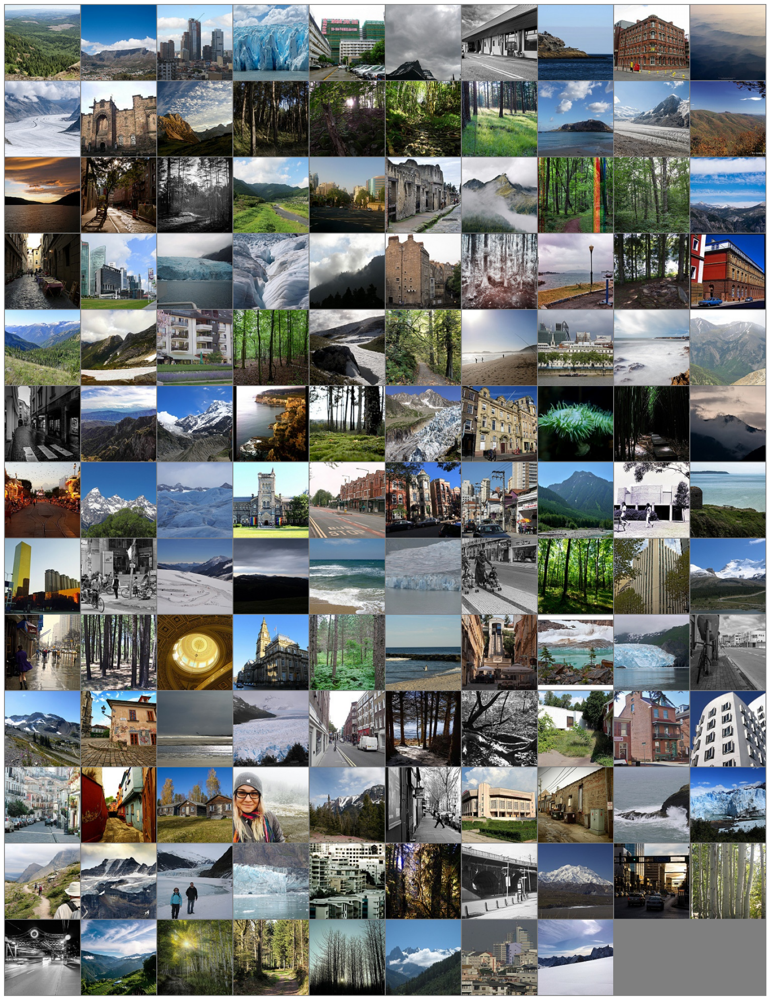

In [15]:
images, _ = next(iter(train_load))
out = torchvision.utils.make_grid(images, nrow = 10)
imshow(out)

In [16]:
for images, labels in train_load:
    print(images.shape)
    print(labels)
    break

torch.Size([128, 3, 170, 170])
tensor([4, 5, 1, 4, 4, 4, 4, 1, 4, 4, 4, 5, 5, 1, 3, 2, 2, 0, 2, 3, 0, 3, 1, 5,
        2, 1, 1, 2, 0, 0, 5, 4, 0, 2, 4, 5, 5, 5, 1, 2, 5, 3, 1, 1, 0, 2, 4, 0,
        1, 1, 0, 3, 5, 0, 5, 5, 4, 2, 3, 1, 3, 3, 5, 5, 4, 2, 2, 5, 4, 4, 4, 2,
        3, 0, 2, 3, 5, 1, 4, 1, 2, 0, 5, 4, 4, 5, 1, 1, 2, 0, 5, 3, 0, 5, 1, 0,
        2, 2, 4, 2, 0, 0, 0, 0, 4, 0, 3, 3, 4, 3, 3, 2, 3, 2, 5, 4, 1, 0, 2, 1,
        3, 1, 2, 3, 5, 4, 3, 0])


In [17]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 12, kernel_size = 4, stride = 2, padding = 2) #output size = (86, 86, 12)
        self.pool = nn.MaxPool2d(kernel_size = 2, stride = 2) # output_size = (42,42,12)
        self.conv2 = nn.Conv2d(in_channels = 12, out_channels = 24, kernel_size = 3, stride = 1, padding = 1) # outpit_sze = (42,42, 24)
        self.fc1 = nn.Linear(24*38*38,300)
        self.dropout = nn.Dropout(0.2)
        self.fc2 = nn.Linear(300,120)#try to reduce it to 128 for example in future
        self.fc3 = nn.Linear(120, 36)
        self.out = nn.Linear(36,6)

    def forward(self,X):
        X = F.relu(self.conv1(X))
        X = self.pool(X)
        X = F.relu(self.conv2(X))
        X = X.view(X.size(0), -1)
        X = F.relu(self.fc1(X))
        X = self.dropout(X)
        X = F.relu(self.fc2(X))
        X = F.relu(self.fc3(X))
        out = F.softmax(self.out(X), dim = 1)
        return out

model = NeuralNetwork()

In [18]:
model.to(torch.device('cuda'))

RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

In [61]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr = 0.01)

In [60]:
optimizer.lr = 0.001

In [59]:
n_epochs = 3
valid_loss_min=np.Inf
train_losslist=[]

In [62]:
for epoch in range(1, n_epochs + 1):
    model.train()
    print(f'{epoch} starts')
    train_loss = 0.0
    valid_loss = 0.0

    print(f'Training happens in epoch {epoch}')
    for images, labels in train_load:
        images = images.to('cuda')
        labels = labels.to('cuda')
        optimizer.zero_grad()
        output = model(images)
        loss = criterion(output, labels)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * images.size(0)
    print(f'Validation happens in epoch {epoch}')
    model.eval()
    for images, labels in valid_load:
        images = images.to('cuda')
        labels = labels.to('cuda')
        output = model(images)
        loss = criterion(output, labels)
        valid_loss += loss.item() * images.size(0)

    train_loss = train_loss/len(train_load.dataset)
    valid_loss = valid_loss/len(valid_load.dataset)
    train_losslist.append(train_loss)

    print(f'Epoch: {epoch} \t Training loss: {train_loss} \t Validation loss: {valid_loss}')

    if valid_loss < valid_loss_min:
        print('Valid_loss decreased')
        torch.save(model.state_dict(),'model.pt')
        valid_loss_min = valid_loss

1 starts
Training happens in epoch 1
Validation happens in epoch 1
Epoch: 1 	 Training loss: 1.7917745608931444 	 Validation loss: 1.8015267429017414
Valid_loss decreased
2 starts
Training happens in epoch 2
Validation happens in epoch 2
Epoch: 2 	 Training loss: 1.7914604412722794 	 Validation loss: 1.8018409860344753
3 starts
Training happens in epoch 3
Validation happens in epoch 3
Epoch: 3 	 Training loss: 1.7911405807990914 	 Validation loss: 1.8021765760062018


In [63]:
total_correct = 0
total_samples = 0
model.eval()

for images, labels in test_load:
    with torch.no_grad():
        images = images.to('cuda')
        labels = labels.to('cuda')
        outputs = model(images)
        _, predicted = torch.max(outputs, dim=1) #first one return probability, second one returns indice(label)
        total_correct += (predicted == labels).sum().item()
        total_samples += labels.size(0)
        
accuracy = total_correct/total_samples

In [64]:
accuracy

0.17